# 3. Characterizing underperformed Real-Estate companies 1-Month Post-COVID19 Vaccine Success 

## Instructions
In 2020 August, the author attempted a characterization of [S&P500 companies based on fundamental metrics during covid19](https://medium.com/analytics-vidhya/characterising-companies-based-on-financial-metrics-during-covid19-1a6ce9cc4ada). Here, the author sought to characterize the performance of S&P500 companies 1-month after [the first covid19 vaccine success announcement by Pfizer](https://www.pfizer.com/news/press-release/press-release-detail/pfizer-and-biontech-conclude-phase-3-study-covid-19-vaccine) on the Nov 18, 2020. Briefly, the stock return was calculated based on the difference between the end of day (eod) stock prices on the Nov 17 and Dec 18, 2020. The contemporary fundamental metrics of the companies were retrieved to investigate their correlations with the top and worst performer during the month.

## Packages
You'll need to you install the quanp package (https://quanp.readthedocs.io/en/latest/installation.html) that should install all necessary packages/libraries required to execute the codes in this tutorial. Please create and use virtualenv with python version 3.6 to avoid dependency problem.

### Install Packages

In [1]:
# import sys
# !conda install seaborn scikit-learn statsmodels numba pytables
# !conda install -c conda-forge python-igraph leidenalg
# !{sys.executable} -m pip install quanp

In [5]:
# importing library packages
from datetime import datetime, timedelta
import os

import matplotlib.pyplot as pl
import numpy as np
import pandas as pd
import quanp as qp
import re

from IPython.display import display
from matplotlib import rcParams

# setting visualization/logging parameters
pd.set_option('display.max_columns', None)
qp.set_figure_params(dpi=100, color_map = 'viridis_r')
qp.settings.verbosity = 1
qp.logging.print_versions()

### Download data
Here, we get the 505 S&P500 member companies listed on the wikipedia & get a list of fundamental metrics for each company from the TD Ameritrade API (All functions are available from the quanp tools).

In [6]:
# S&P 500 metadata
df_metadata = qp.datasets.get_wiki_sp500_metadata()

The metadata file has been initialized and saved as /Users/leehongkai/OneDrive/Finance/quanp/notebooks/data/metadata/sp500_metadata.csv


In [7]:
# S&P 500 fundamentals
# df_fundamental = qp.datasets.download_tickers_fundamental()


In [8]:
# Download End of Day (eod) price history from the current sp500 list
# qp.datasets.download_tickers_price_history_fromlist(df_metadata.index)

### Loading and preparing data

In [9]:
# Optional: The data retried in cell above were saved as csv file You may activated this cell to avoid 
# rerunning the downloading cell above.
df_fundamental = pd.read_csv('data/metadata/sp500_metadata_fundamentalAdded.csv', index_col=0)
print(df_fundamental.columns)

Index(['Security', 'SEC filings', 'GICS Sector', 'GICS Sub-Industry',
       'Headquarters Location', 'Date first added', 'CIK', 'Founded', 'beta',
       'bookValuePerShare', 'currentRatio', 'divGrowthRate3Year',
       'dividendAmount', 'dividendDate', 'dividendPayAmount',
       'dividendPayDate', 'dividendYield', 'epsChange', 'epsChangePercentTTM',
       'epsChangeYear', 'epsTTM', 'grossMarginMRQ', 'grossMarginTTM', 'high52',
       'interestCoverage', 'low52', 'ltDebtToEquity', 'marketCap',
       'marketCapFloat', 'netProfitMarginMRQ', 'netProfitMarginTTM',
       'operatingMarginMRQ', 'operatingMarginTTM', 'pbRatio', 'pcfRatio',
       'peRatio', 'pegRatio', 'prRatio', 'quickRatio', 'returnOnAssets',
       'returnOnEquity', 'returnOnInvestment', 'revChangeIn', 'revChangeTTM',
       'revChangeYear', 'sharesOutstanding', 'shortIntDayToCover',
       'shortIntToFloat', 'symbol', 'totalDebtToCapital', 'totalDebtToEquity',
       'vol10DayAvg', 'vol1DayAvg', 'vol3MonthAvg'],
     

In [10]:
# prepare End of Day (eod) for each company
df_eod = qp.datasets.process_eod_price(df_metadata.index, startdate='2020-11-17', enddate='2020-12-18')
df_eod

BRK.B was excluded as the ticker csv was not found in the  /Users/leehongkai/OneDrive/Finance/quanp/notebooks/data/daily
BF.B was excluded as the ticker csv was not found in the  /Users/leehongkai/OneDrive/Finance/quanp/notebooks/data/daily


,MMM,ABT,ABBV,ABMD,ACN,ATVI,ADBE,AMD,AAP,AES,AFL,A,APD,AKAM,ALK,ALB,ARE,ALXN,ALGN,ALLE,LNT,ALL,GOOGL,GOOG,MO,AMZN,AMCR,AEE,AAL,AEP,AXP,AIG,AMT,AWK,AMP,ABC,AME,AMGN,APH,ADI,ANSS,ANTM,AON,AOS,APA,AAPL,AMAT,APTV,ADM,ANET,AJG,AIZ,T,ATO,ADSK,ADP,AZO,AVB,AVY,BKR,BLL,BAC,BK,BAX,BDX,BBY,BIO,BIIB,BLK,BA,BKNG,BWA,BXP,BSX,BMY,AVGO,BR,CHRW,COG,CDNS,CPB,COF,CAH,KMX,CCL,CARR,CTLT,CAT,CBOE,CBRE,CDW,CE,CNC,CNP,CERN,CF,SCHW,CHTR,CVX,CMG,CB,CHD,CI,CINF,CTAS,CSCO,C,CFG,CTXS,CLX,CME,CMS,KO,CTSH,CL,CMCSA,CMA,CAG,CXO,COP,ED,STZ,COO,CPRT,GLW,CTVA,COST,CCI,CSX,CMI,CVS,DHI,DHR,DRI,DVA,DE,DAL,XRAY,DVN,DXCM,FANG,DLR,DFS,DISCA,DISCK,DISH,DG,DLTR,D,DPZ,DOV,DOW,DTE,DUK,DRE,DD,DXC,EMN,ETN,EBAY,ECL,EIX,EW,EA,EMR,ETR,EOG,EFX,EQIX,EQR,ESS,EL,ETSY,EVRG,ES,RE,EXC,EXPE,EXPD,EXR,XOM,FFIV,FB,FAST,FRT,FDX,FIS,FITB,FE,FRC,FISV,FLT,FLIR,FLS,FMC,F,FTNT,FTV,FBHS,FOXA,FOX,BEN,FCX,GPS,GRMN,IT,GD,GE,GIS,GM,GPC,GILD,GL,GPN,GS,GWW,HAL,HBI,HIG,HAS,HCA,PEAK,HSIC,HSY,HES,HPE,HLT,HFC,HOLX,HD,HON,HRL,HST,HWM,HPQ,HUM,HBAN,HII,IEX,IDXX,INFO,ITW,ILMN,INCY,IR,INTC,ICE,IBM,IP,IPG,IFF,INTU,ISRG,IVZ,IPGP,IQV,IRM,JKHY,J,JBHT,SJM,JNJ,JCI,JPM,JNPR,KSU,K,KEY,KEYS,KMB,KIM,KMI,KLAC,KHC,KR,LB,LHX,LH,LRCX,LW,LVS,LEG,LDOS,LEN,LLY,LNC,LIN,LYV,LKQ,LMT,L,LOW,LUMN,LYB,MTB,MRO,MPC,MKTX,MAR,MMC,MLM,MAS,MA,MKC,MXIM,MCD,MCK,MDT,MRK,MET,MTD,MGM,MCHP,MU,MSFT,MAA,MHK,TAP,MDLZ,MNST,MCO,MS,MOS,MSI,MSCI,NDAQ,NOV,NTAP,NFLX,NWL,NEM,NWSA,NWS,NEE,NLSN,NKE,NI,NSC,NTRS,NOC,NLOK,NCLH,NRG,NUE,NVDA,NVR,ORLY,OXY,ODFL,OMC,OKE,ORCL,OTIS,PCAR,PKG,PH,PAYX,PAYC,PYPL,PNR,PBCT,PEP,PKI,PRGO,PFE,PM,PSX,PNW,PXD,PNC,POOL,PPG,PPL,PFG,PG,PGR,PLD,PRU,PEG,PSA,PHM,PVH,QRVO,PWR,QCOM,DGX,RL,RJF,RTX,O,REG,REGN,RF,RSG,RMD,RHI,ROK,ROL,ROP,ROST,RCL,SPGI,CRM,SBAC,SLB,STX,SEE,SRE,NOW,SHW,SPG,SWKS,SLG,SNA,SO,LUV,SWK,SBUX,STT,STE,SYK,SIVB,SYF,SNPS,SYY,TMUS,TROW,TTWO,TPR,TGT,TEL,FTI,TDY,TFX,TER,TSLA,TXN,TXT,TMO,TIF,TJX,TSCO,TT,TDG,TRV,TFC,TWTR,TYL,TSN,UDR,ULTA,USB,UAA,UA,UNP,UAL,UNH,UPS,URI,UHS,UNM,VLO,VAR,VTR,VRSN,VRSK,VZ,VRTX,VFC,VIAC,VTRS,V,VNT,VNO,VMC,WRB,WAB,WMT,WBA,DIS,WM,WAT,WEC,WFC,WELL,WST,WDC,WU,WRK,WY,WHR,WMB,WLTW,WYNN,XEL,XRX,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS
2020-11-17 00:00:00+00:00,173.64,113.06,99.21,269.93,243.82,77.11,467.95,83.36,149.30,21.35,43.00,109.86,266.29,102.45,47.46,127.95,165.29,127.69,451.38,115.46,54.730,99.37,1761.66,1770.15,41.19,3135.66,11.93,80.60,12.70,86.73,116.48,38.42,239.18,159.29,184.23,104.89,118.76,232.44,127.06,135.87,319.790,329.84,207.19,56.38,11.44,119.390,74.370,114.44,50.16,277.78,117.08,138.59,29.03,100.05,252.71,176.15,1124.21,174.12,149.44,19.26,97.14,27.55,39.44,80.78,242.41,119.02,592.57,248.81,667.49,210.05,2081.25,38.00,98.46,35.03,64.32,380.60,147.28,93.55,17.18,113.48,49.38,87.76,54.68,94.73,18.05,40.36,104.97,171.91,86.80,60.49,136.78,132.41,67.28,25.17,74.77,32.22,48.90,641.51,87.04,1268.48,150.03,87.21,214.81,79.705,361.41,41.88,50.73,33.07,119.68,209.10,168.07,63.83,53.68,77.00,85.35,49.78,52.01,35.74,56.23,38.85,79.25,205.05,332.45,116.19,36.48,37.02,371.92,166.34,92.500,231.08,67.14,73.47,229.35,108.53,113.39,258.21,37.60,48.90,13.11,334.35,37.310,142.42,77.10,24.300,22.000,34.05,208.75,93.82,84.17,384.47,125.41,54.48,132.84,92.92,39.85,63.16,22.05,97.01,116.07,48.33,212.27,65.60,85.18,118.52,76.39,111.96,45.67,171.95,751.18,62.50,260.00,256.95,128.82,56.57,91.75,238.39,43.070,123.03,89.90,117.87,38.67,162.09,275.00,47.255,91.31,285.05,146.97,26.05,28.74,134.47,109.95,267.99,37.23,33.60,115.69,8.75,118.42,71.65,83.39,28.160,27.650,21.48,21.03,24.56,117.33,158.71,151.47,9.68,61.28,41.98,98.48,60.97,93.79,189.83,224.65,410.46,15.81,13.53,46.43,91.89,153.03,30.81,64.61,152.93,47.31,10.48,103.34,23.61,72.000,272.47,205.33,51.33,14.140,23.50,20.50,422.23,12.02,162.82,197.19,455.85,92.29,209.87,297.95,82.98,44.64,45.530,100.03,117.70,50.09,21.90,114.51,358.75,749.15,16.30,199.32,172.21,25.90,158.85,105.30,133.04,118.43,149.35,44.71,116.11,22.21,191.57,66.32,15.67,117.56,143.83,15.07,14.03,241.84,31.59,31.90,35.45,198.43,204.77,431.93,74.50,57.50,42.76,100.28,75.71,141.20,43.10,252.14,68.78,3

In [11]:
# calculate the 1-month log return of the stock price for each company, i.e. price difference
# between Nov 17 and Dec 18, 2020.
df_log_return_1mth = pd.DataFrame(np.log(df_eod.iloc[-1]) - np.log(df_eod.iloc[0]), 
                                  columns=['log_return_1mth'])
df_log_return_1mth.describe()

,log_return_1mth
count,503.000000
mean,0.034189
std,0.078201
min,-0.194942
25%,-0.015173
50%,0.021695
75%,0.068664
max,0.453485


In [12]:
# merging fundamental data with the log_return data
df_fundamental_logreturn = pd.merge(df_fundamental, df_log_return_1mth, how='inner', left_index=True, right_index=True)

In [13]:
ls_fundamental_target = ['log_return_1mth'] + ['beta','bookValuePerShare','currentRatio', 'quickRatio', 
'dividendYield', 'epsChangePercentTTM', 'epsChangeYear', 'epsTTM', 'grossMarginMRQ', 'grossMarginTTM', 
'interestCoverage', 'marketCap', 'marketCapFloat', 'netProfitMarginMRQ','netProfitMarginTTM', 
'operatingMarginMRQ', 'operatingMarginTTM', 'peRatio', 'pegRatio', 'pbRatio', 'pcfRatio',
'prRatio', 'returnOnAssets', 'returnOnEquity', 'returnOnInvestment', 'revChangeIn', 'revChangeTTM', 
'revChangeYear', 'sharesOutstanding', 'shortIntDayToCover', 'shortIntToFloat', 'totalDebtToCapital', 
'totalDebtToEquity', 'ltDebtToEquity', 'vol10DayAvg', 'vol1DayAvg', 'vol3MonthAvg']

In [14]:
from sklearn.preprocessing import MinMaxScaler

# Minmax scaling (0, 1) for all the variables/features
scaler = MinMaxScaler()
df_fundamental_logreturn_minmax = pd.DataFrame(scaler.fit_transform(df_fundamental_logreturn[ls_fundamental_target]), 
                                  index=df_fundamental_logreturn.index,
                                  columns=ls_fundamental_target)

df_fundamental_logreturn_minmax[ls_fundamental_target].describe()

,log_return_1mth,beta,bookValuePerShare,currentRatio,quickRatio,dividendYield,epsChangePercentTTM,epsChangeYear,epsTTM,grossMarginMRQ,grossMarginTTM,interestCoverage,marketCap,marketCapFloat,netProfitMarginMRQ,netProfitMarginTTM,operatingMarginMRQ,operatingMarginTTM,peRatio,pegRatio,pbRatio,pcfRatio,prRatio,returnOnAssets,returnOnEquity,returnOnInvestment,revChangeIn,revChangeTTM,revChangeYear,sharesOutstanding,shortIntDayToCover,shortIntToFloat,totalDebtToCapital,totalDebtToEquity,ltDebtToEquity,vol10DayAvg,vol1DayAvg,vol3MonthAvg
count,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,5.030000e+02,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.0,503.000000,503.0,503.0,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000
mean,0.353365,0.226347,0.056875,0.145271,0.114280,0.184364,1.989590e-03,0.016070,0.024672,0.403637,0.412475,0.006728,0.029232,0.035193,0.067435,0.085000,0.267448,0.239645,0.010920,0.005163,0.011726,0.033014,0.133036,0.121769,0.009609,0.087929,0.039743,0.058798,0.0,0.036025,0.0,0.0,0.106306,0.013118,0.011910,0.047535,0.047751,0.042469
std,0.120602,0.116664,0.079418,0.119241,0.125906,0.176910,4.458773e-02,0.056459,0.057981,0.259537,0.264081,0.051631,0.079591,0.071170,0.067395,0.086340,0.195124,0.183059,0.047321,0.051840,0.051304,0.055139,0.138410,0.134736,0.059772,0.108005,0.081471,0.126125,0.0,0.071726,0.0,0.0,0.090536,0.051405,0.050613,0.098145,0.098113,0.089361
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.277238,0.157283,0.000000,0.078093,0.000000,0.021329,0.000000e+00,0.000000,0.005598,0.208339,0.217849,0.000187,0.005001,0.008167,0.025067,0.028863,0.119914,0.103099,0.003518,0.000000,0.001694,0.013778,0.044892,0.021036,0.000780,0.002025,0.003512,0.000000,0.0,0.008425,0.0,0.0,0.064701,0.002557,0.002164,0.010087,0.010129,0.008998
50%,0.334096,0.217107,0.039281,0.127539,0.097960,0.147817,0.000000e+00,0.001366,0.015117,0.405001,0.411348,0.001212,0.010134,0.016803,0.057756,0.069392,0.246738,0.220733,0.006269,0.000000,0.003511,0.022887,0.085881,0.083621,0.002106,0.057268,0.017471,0.000000,0.0,0.017106,0.0,0.0,0.096443,0.004915,0.004538,0.019402,0.019527,0.017681
75%,0.406531,0.285650,0.074949,0.195404,0.162827,0.290675,8.397892e-07,0.011987,0.027749,0.607227,0.612949,0.003111,0.024011,0.034315,0.096650,0.118865,0.379776,0.339604,0.009728,0.001298,0.007707,0.035563,0.170012,0.171502,0.004450,0.124267,0.041234,0.070568,0.0,0.034554,0.0,0.0,0.135109,0.009902,0.008895,0.043851,0.043874,0.040277
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [15]:
# Loading pandas dataframe as anndata 
adata = qp.AnnData(df_fundamental_logreturn_minmax[ls_fundamental_target])

# Saving raw data for visualization later
adata.raw = adata

# log(x+1) transformation for all data
qp.pp.log1p(adata)

# Standardization scaling per feature
qp.pp.scale(adata)

In [16]:
# add a new `.obs` column for all comapnanies called `GICS_Sector`
adata.obs['GICS_Sector'] = df_fundamental_logreturn['GICS Sector'].values

adata

AnnData object with n_obs × n_vars = 503 × 38
    obs: 'GICS_Sector'
    var: 'mean', 'std'
    uns: 'log1p'

### Principal component analysis (PCA)
Reduce the dimensionality of the data by running PCA, which reveals the main axes of variation and denoises the data.

In [17]:
qp.tl.pca(adata, svd_solver='arpack', random_state=42)

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function ```qp.tl.leiden()```, ```qp.tl.louvain()```, or ```tSNE qp.tl.tsne()```. In our experience, often, a rough estimate of the number of PCs does fine. The 'elbow' point seems to suggest at least up to PC5 will be useful to characterize the companies. We are going to do further dimensional reduction based on the first 6 PCs later. We will perform a factor analysis to check for the underlying features that made up these PCs in a separate tutorial notebook later.

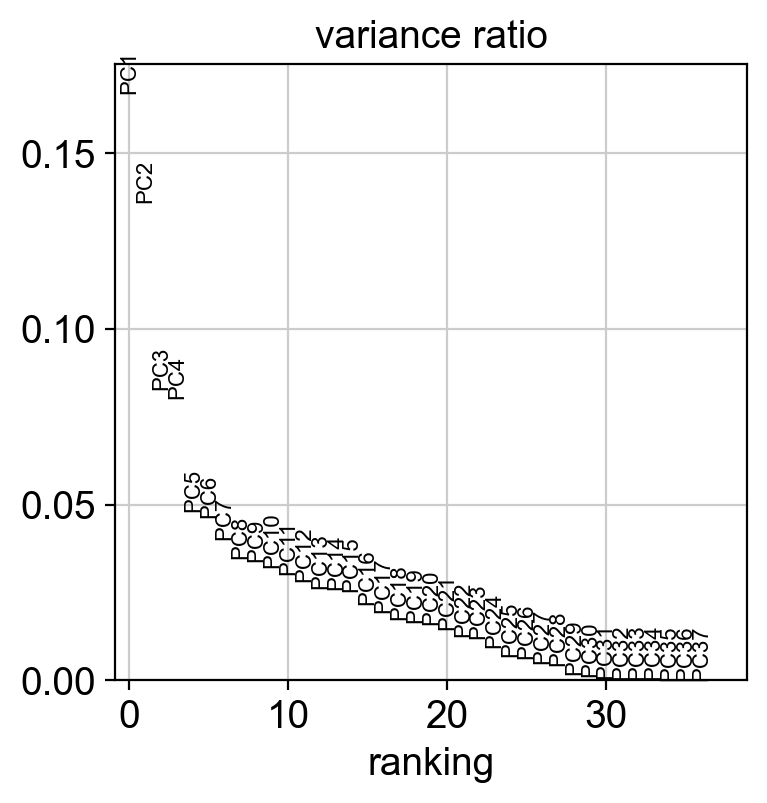

In [18]:
qp.pl.pca_variance_ratio(adata, n_pcs=len(adata.var_names))

In [19]:
# Optional: save the anndata in h5ad for reloading of the processed data later
# adata.write('data/sp500_1mthlogreturn_afterVaccineSuccess.h5ad')
# adata.read('data/sp500_1mthlogreturn_afterVaccineSuccess.h5ad')
adata

AnnData object with n_obs × n_vars = 503 × 38
    obs: 'GICS_Sector'
    var: 'mean', 'std'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

### Computing the T-distributed Stochastic Neighbor Embedding (tSNE)

Let us further reduce the dimensionality of the signficant PCs identified above wholly in to 2 dimensions using the tSNE tool implemented as ```qp.tl.tsne(adata)```.

In [20]:
qp.tl.tsne(adata, n_pcs=5, random_state=42); # only consider the first 8 pcs

### Computing the neighborhood graph

Before we view the tsne plots with Sector annotations, Let us compute the neighborhood graph of companies using the PCA representation of the data matrix. This will give rise to distances and connectivities in each company. Here, we consider 10 nearest neighbors with 6 PCs derived from the PCA

In [21]:
qp.pp.neighbors(adata, n_neighbors=10, n_pcs=5, random_state=42);

### Clustering the neighborhood graph

Here, we use Leiden graph-clustering method (community detection based on optimizing modularity) by Traag *et al.* (2018) to cluster the neighborhood graph of companies, which we already computed in the previous section.

In [22]:
qp.tl.leiden(adata)

We can now map and view the annotations of leiden clustering, GICS_Sector, or any financial metrics/features on the tsne plots. We can see that companies from the Leiden Clusters 7 and 10 seems to perform the best 1 month post-vaccine-success, while the worst performers seem to be ones from the Clusters 2 and 9.

In [23]:
# # Check data distribution of the log_return_1mth to set a appropriate vmin cutoff
df_fundamental_logreturn_minmax['log_return_1mth'].describe()

count    503.000000
mean       0.353365
std        0.120602
min        0.000000
25%        0.277238
50%        0.334096
75%        0.406531
max        1.000000
Name: log_return_1mth, dtype: float64

/Users/leehongkai/anaconda/envs/quanp_py36/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'GICS_Sector' as categorical


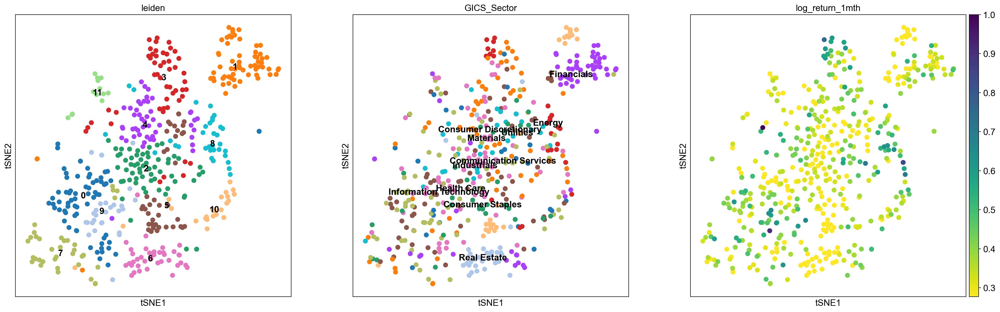

In [24]:
rcParams['figure.figsize'] = 8,8
qp.pl.tsne(adata, color=['leiden', 'GICS_Sector', 'log_return_1mth'], 
           vmin=0.277238, legend_loc='on data', use_raw=True)

### Embedding the neighborhood graph

We can also embed the neighborhood graph in 2 dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE. Before running the UMAP, we compute the correlations between clusters as initiating positions for the UMAP.

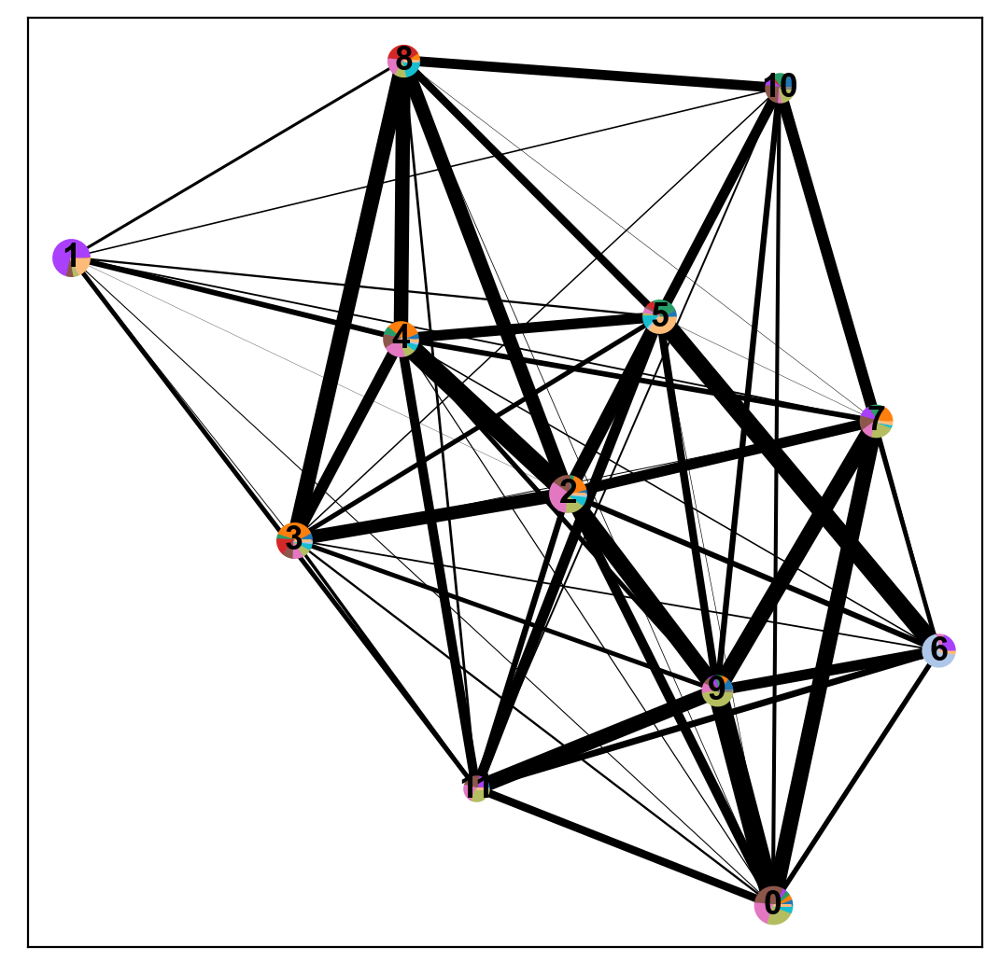

In [25]:
rcParams['figure.figsize'] = 6,6
qp.tl.paga(adata)
qp.pl.paga(adata, color=['GICS_Sector'], plot=True)

We can now map and view the annotations of leiden clustering, GICS_Sector, or any financial metrics/features on the umap plots. Again, we can see that companies from the Leiden Clusters 7 and 10 seems to perform the best 1 month post-vaccine-success, while the worst performers seem to be ones from the Clusters 2 and 9.

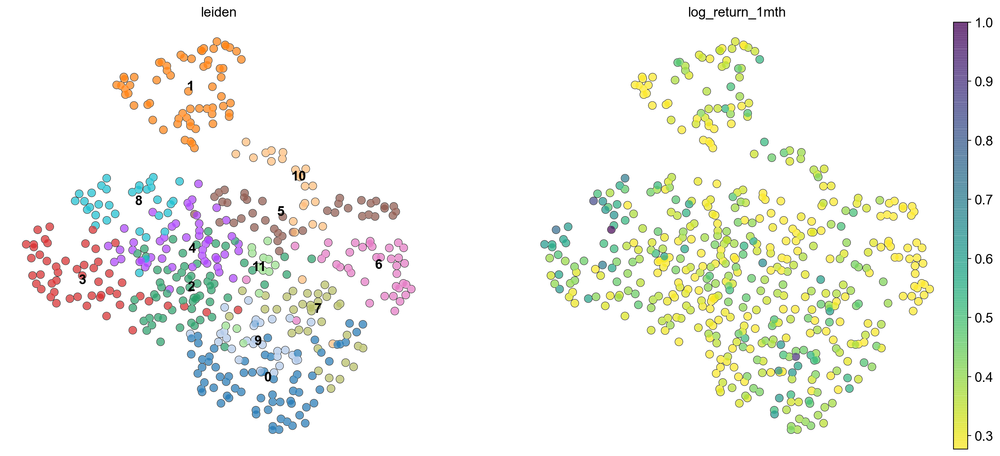

In [26]:
rcParams['figure.figsize'] = 8,8
qp.tl.umap(adata, init_pos='paga', random_state=42)
qp.pl.umap(adata, color=['leiden', 'log_return_1mth'], 
           legend_loc='on data', frameon=False, ncols=4, 
           vmin=0.277238, vmax=1.0, use_raw=True,
           add_outline=True, outline_width=(0.05, 0.01))

### Characterizing the clusters of companies

We run `qp.tl.dendrogram` to compute hierarchical clustering. Multiple visualizations that can
then include a dendrogram: `qp.pl.matrixplot`, `qp.pl.heatmap`, `qp.pl.dotplot` and `qp.pl.stacked_violin`. 

In [27]:
qp.tl.dendrogram(adata, 'leiden', var_names=adata.var_names);

/Users/leehongkai/anaconda/envs/quanp_py36/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


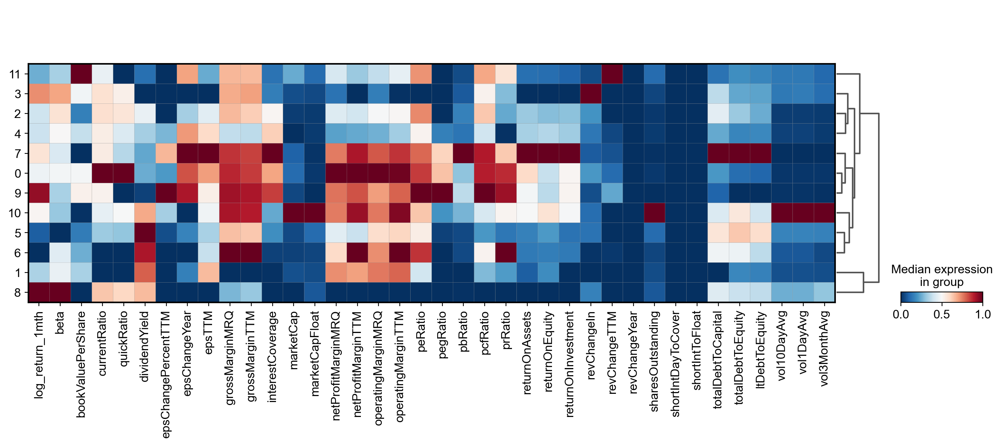

In [28]:
qp.pl.matrixplot(adata, var_names=adata.var_names, groupby='leiden', use_raw=False, 
              cmap='RdBu_r', dendrogram=True, standard_scale='var')

The matrixplot shows the median for each cluster/group of companies. Again, we are seeing Cluster 10 was the top performer in 'log_return_1mth', followed by Cluster 7, Cluster 4, and Cluster 6. Besides, we can also see that the 'beta' was high in both Clusters 10 and 7. In order to confirm the results, we are printing out the exact median for each cluster/group in dataframe.

In [29]:
df_leiden = pd.DataFrame(adata.obs['leiden'])
df_all = pd.merge(df_fundamental_logreturn, df_leiden, how='inner', left_index=True, right_index=True)
df_all[['GICS_Sector', 'GICS_SubIndustry']] = df_fundamental_logreturn[['GICS Sector', 'GICS Sub-Industry']]

# sort clusters by median log_return_1mth
stats_perCluster = df_all.groupby(['leiden']).agg({'log_return_1mth': ['median', 'min', 
                     'max', 'mean']}).dropna()
stats_perCluster.columns = ['median', 'min', 'max', 'mean']
stats_perCluster.sort_values(['median'], ascending=False).style.background_gradient(cmap='bwr', axis=0)

,median,min,max,mean
leiden,,,,
8,0.103931,-0.041325,0.354671,0.101642
9,0.095243,-0.031522,0.392600,0.104538
3,0.065420,-0.023377,0.453485,0.090324
7,0.042159,-0.062765,0.188069,0.042714
10,0.033966,-0.036846,0.193823,0.045277
0,0.029478,-0.075752,0.205872,0.032342
2,0.018952,-0.154809,0.231976,0.032441
4,0.018178,-0.194942,0.176049,0.014633
1,0.011318,-0.140537,0.152153,0.005704


Dataframe above shows that the median of 'log_return_1mth' was the highest in Leiden Cluster 10, while the lowest were Cluster 2. To confirm the 'beta', we did the similar in the following cell. We typically dislike high beta as it usually means the company is [more risky](https://www.investopedia.com/investing/beta-know-risk/).

In [30]:
# sort clusters by median beta
stats_perCluster = df_all.groupby(['leiden']).agg({'beta': ['median', 'min', 
                     'max', 'mean']}).dropna()
stats_perCluster.columns = ['median', 'min', 'max', 'mean']
stats_perCluster.sort_values(['median'], ascending=False).style.background_gradient(cmap='bwr', axis=0)

,median,min,max,mean
leiden,,,,
8,1.818040,1.006990,2.895120,1.907955
3,1.360690,0.791820,4.900250,1.575118
2,1.178360,0.000000,2.259150,1.220481
4,1.082690,0.467950,2.253310,1.183186
0,1.060175,0.000000,1.584150,0.997718
1,1.026930,0.119030,2.247090,1.085153
6,0.993320,0.076360,1.737620,0.930215
7,0.974160,0.273320,1.831970,0.944492
9,0.856785,0.000000,1.658140,0.870808


## Visualizing the important features defining each cluster
Instead of looking at all features of clusters as previously, we can identify features/metrics that are differentially characterizing each cluster. Here, we can see that the Cluster 10 was significantly postive-correlated with higher beta, volatility 3-month average (vol3MonthAvg), volatility 10-day average (vol10DayAvg), vol1DayAvg, but negatively associated with lower earning per share Trailing-twelve-month (epsTTM), price per earning ration (peRatio), operatingMarginTTM, netProfitMarginTTM, returnOnAssets, etc. 

The worst performer, Cluster 2, was associated with higher dividendYield, grossMarginMRQ, grossMarginTTM, TotalDebtToEquity, etc, and lower current, quick ratio, returnOnAssets, etc.

Here, the author is particularly interested in the companies from the Cluster 4, which associated with lower beta, that typically means that the stocks in this cluster are considered less risky. Of note, the Cluster 4 were associated with favorable higher Operating Profitability Factors ('netProfitMarginTTM', 'netProfitMarginMRQ', 'grossMarginTTM', 'grossMarginMRQ', 'returnOnInvestment', 'returnOnAssets', 'operatingMarginTTM', 'operatingMarginMRQ') and lower Financial Risk Factors ('ITDebtToEquity' and 'TotalDebtToEquity')

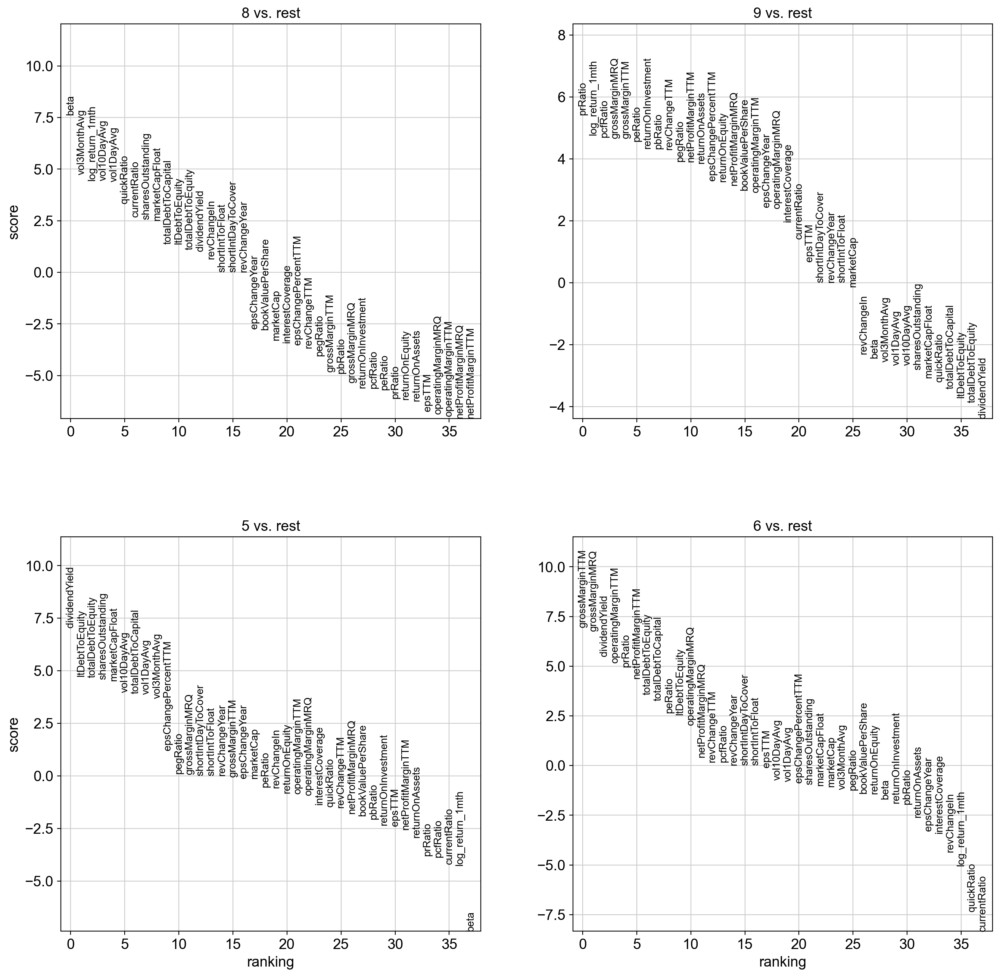

In [31]:
qp.tl.rank_features_groups(adata, 'leiden', groups=['8', '9', '5', '6'], method='wilcoxon')
qp.pl.rank_features_groups(adata, n_features=38, sharey=False, fontsize=10, ncols=2)

We can map and view the annotations of leiden clustering based on the financial metrics/features on the umap plots below. Here, we see that Leiden Clusters 7 and 10 indeed mostly featured by high beta and unfavorable lower Operating Profitabiity Factors; Cluster 4 was featured by many favourable higher Operating Profitability Factors; Clusters 2 and 9 were featured by unfavorable lower Solvency Factors (current, quick ratios).

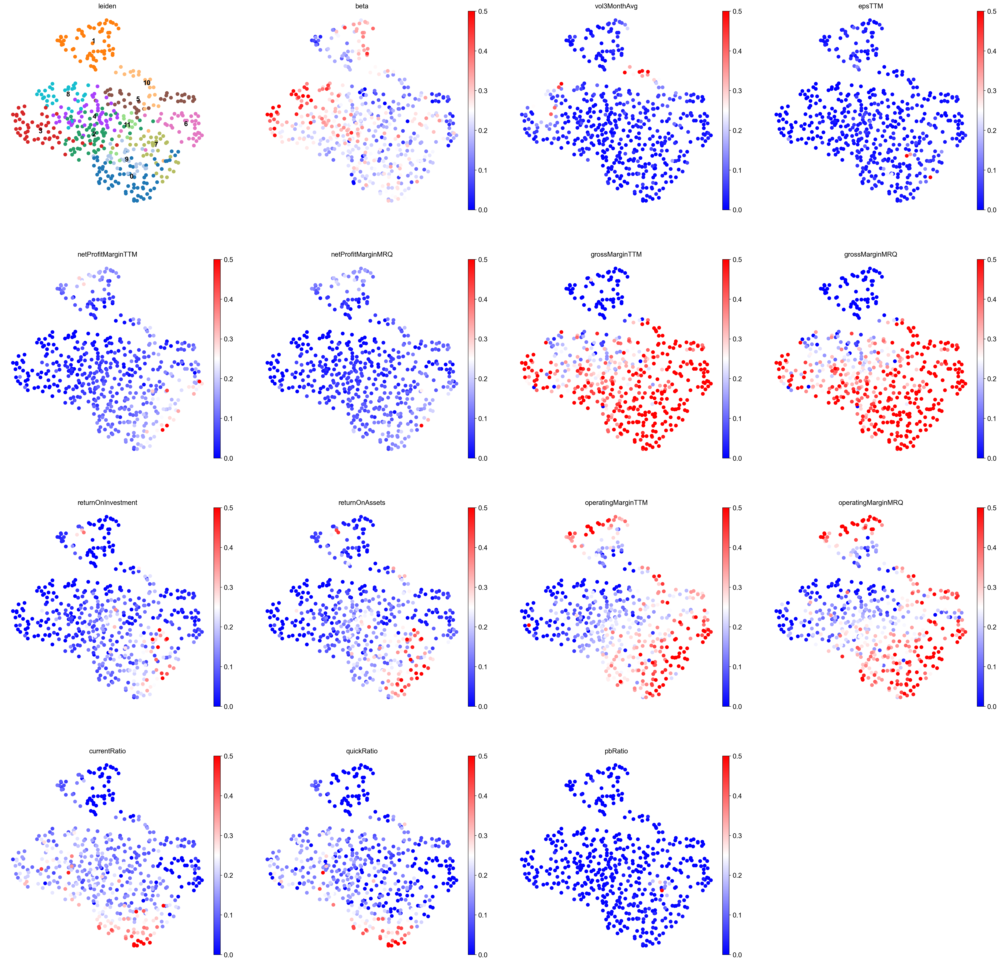

In [32]:
rcParams['figure.figsize'] = 8,8
qp.pl.umap(adata, color=['leiden', 'beta', 'vol3MonthAvg', 'epsTTM', 'netProfitMarginTTM', 
                         'netProfitMarginMRQ', 'grossMarginTTM', 'grossMarginMRQ', 
                         'returnOnInvestment', 'returnOnAssets', 'operatingMarginTTM', 
                         'operatingMarginMRQ', 'currentRatio', 'quickRatio', 'pbRatio'], 
           legend_loc='on data', frameon=False, ncols=4, cmap='bwr', vmax=0.5)

### Sector performance in the Cluster 9 companies

In [33]:
stats_perCluster = df_all.groupby(['leiden', 'GICS_Sector']).agg({'log_return_1mth': ['median', 'min', 'max', 'mean']}).dropna()

stats_perCluster.columns = ['median', 'min', 'max', 'mean']
stats_perCluster = stats_perCluster.reset_index()
stats_perCluster[stats_perCluster.leiden == '9'].sort_values(['median'], ascending=False).\
                                                style.background_gradient(cmap='bwr', axis=0)

,leiden,GICS_Sector,median,min,max,mean
38,4,Utilities,0.054240,0.054240,0.054240,0.054240
35,4,Information Technology,0.050891,-0.017777,0.088005,0.043462
37,4,Real Estate,0.045249,0.045249,0.045249,0.045249
31,4,Consumer Discretionary,0.040377,-0.194942,0.176049,0.033152
36,4,Materials,0.022896,-0.052302,0.023281,-0.002041
34,4,Industrials,0.012675,-0.054308,0.054273,0.009945
33,4,Health Care,0.002295,-0.061740,0.047898,-0.005495
32,4,Consumer Staples,-0.011466,-0.026621,0.018178,-0.007844
30,4,Communication Services,-0.029632,-0.110431,-0.019124,-0.053062


In [35]:
# Printing out Cluster 6 companies
len(df_all[df_all.leiden == '9'][['Security', 'GICS Sector', 'GICS Sub-Industry']])

28

In [36]:
adata_c9 = adata[adata.obs['leiden'] == '9']

# Standardization scaling per feature
qp.pp.scale(adata_c9)

/Users/leehongkai/anaconda/envs/quanp_py36/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/leehongkai/anaconda/envs/quanp_py36/lib/python3.6/site-packages/quanp/preprocessing/_simple.py:813: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [38]:
adata_c9

AnnData object with n_obs × n_vars = 28 × 38
    obs: 'GICS_Sector', 'leiden'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'leiden_colors', 'GICS_Sector_colors', 'paga', 'leiden_sizes', 'umap', "dendrogram_['leiden']", 'rank_features_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [41]:
qp.tl.pca(adata_c9, svd_solver='arpack', random_state=42)

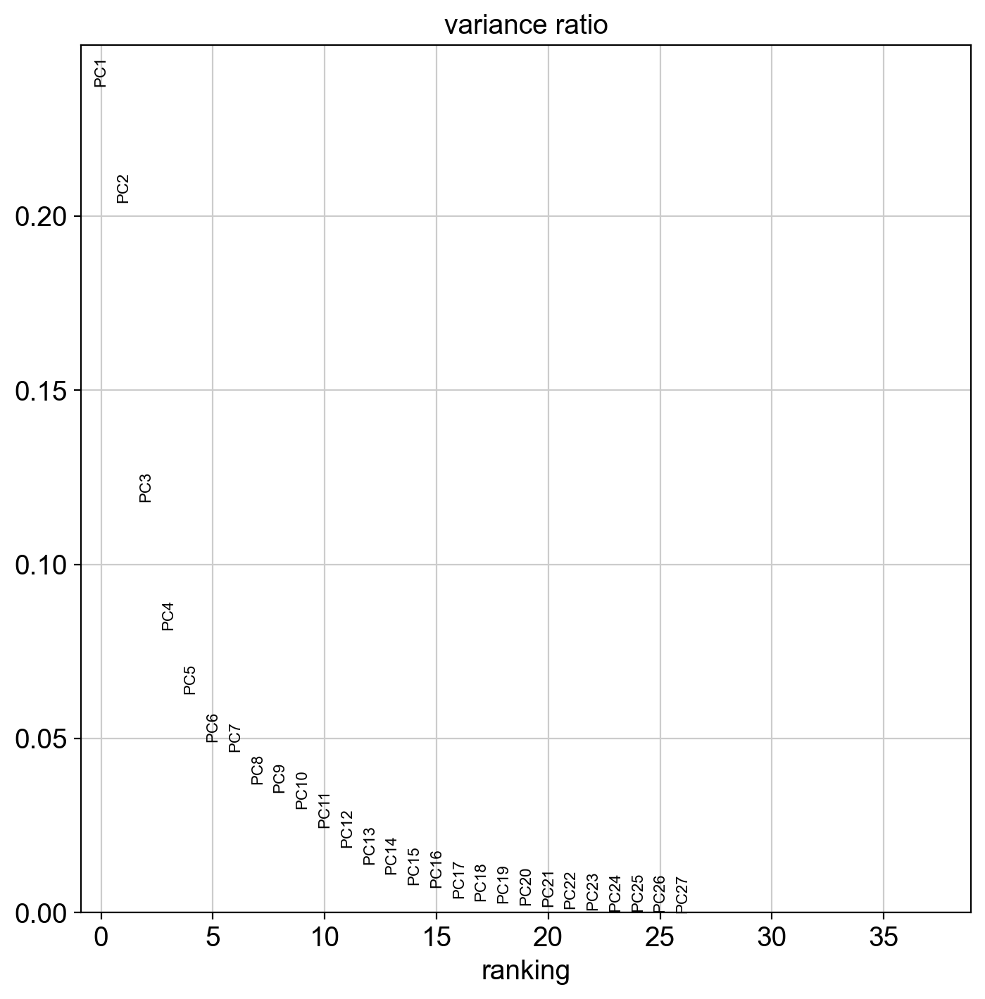

In [42]:
qp.pl.pca_variance_ratio(adata_c9, n_pcs=len(adata.var_names))

In [85]:
qp.tl.tsne(adata_c9, n_pcs=8, random_state=42); # only consider the first 8 pcs

In [111]:
qp.pp.neighbors(adata_c9, n_neighbors=4, n_pcs=6, random_state=42);

In [112]:
qp.tl.leiden(adata_c9, resolution=0.5)


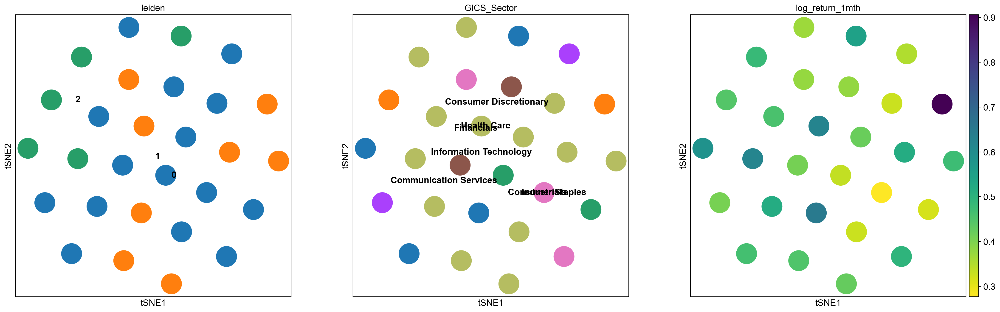

In [113]:
rcParams['figure.figsize'] = 8,8
qp.pl.tsne(adata_c9, color=['leiden', 'GICS_Sector', 'log_return_1mth'], 
           vmin=0.277238, legend_loc='on data', use_raw=True)

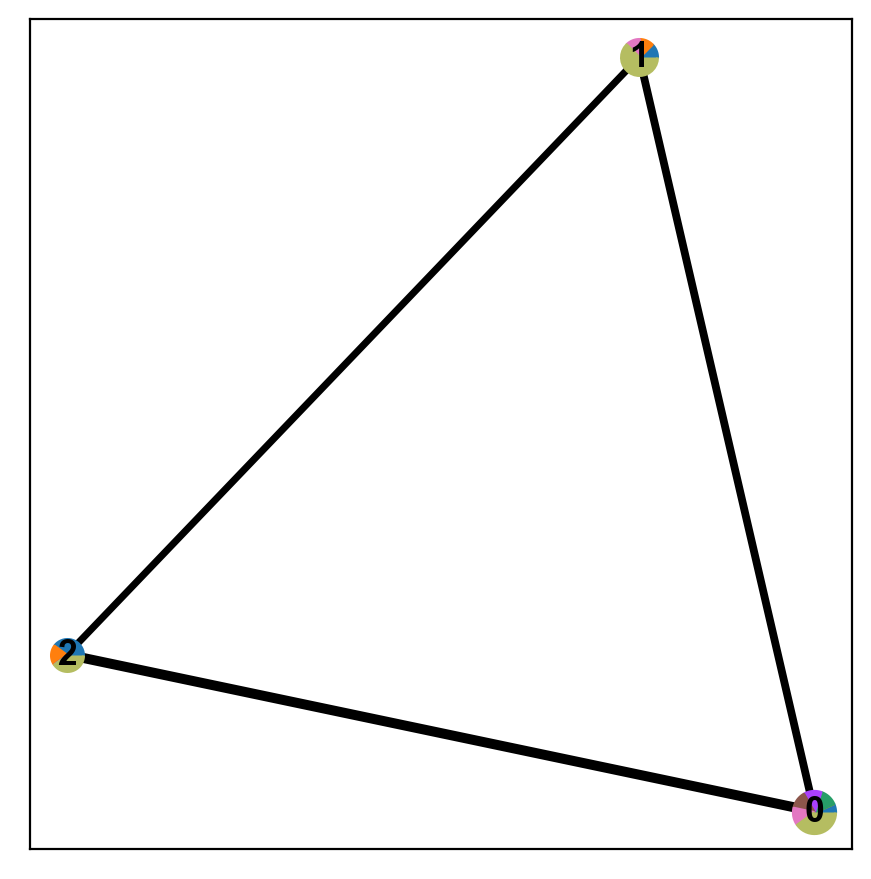

In [114]:
rcParams['figure.figsize'] = 5,5
qp.tl.paga(adata_c9)
qp.pl.paga(adata_c9, color=['GICS_Sector'], plot=True)

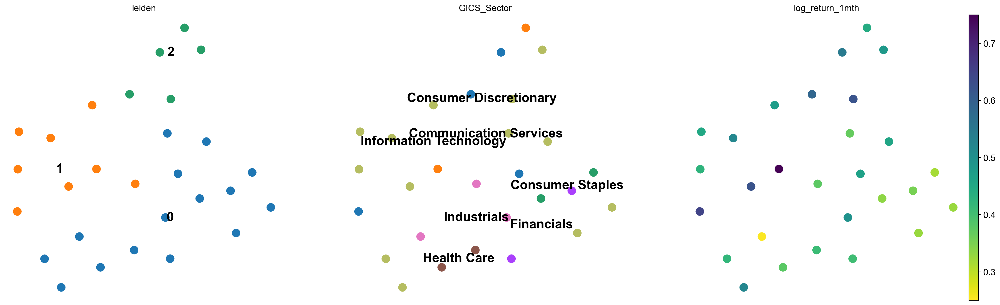

In [115]:
rcParams['figure.figsize'] = 8,8
qp.tl.umap(adata_c9, init_pos='paga', random_state=42)
qp.pl.umap(adata_c9, color=['leiden', 'GICS_Sector', 'log_return_1mth'], 
           legend_loc='on data', frameon=False, ncols=4, 
           vmin=0.25, vmax=0.75, use_raw=True, legend_fontsize=20, s=700)

In [116]:
qp.tl.dendrogram(adata_c9, 'leiden', var_names=adata.var_names);


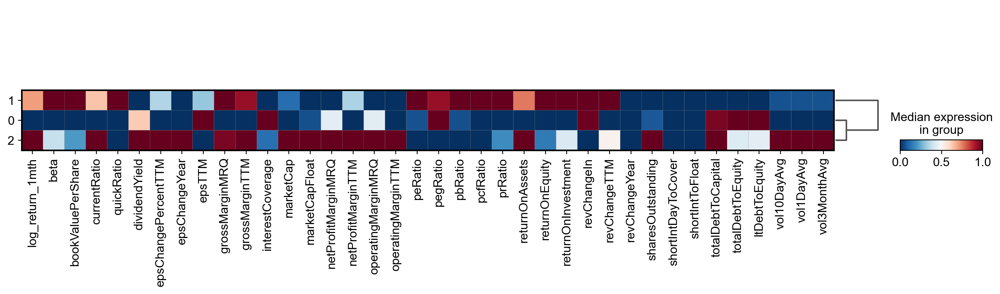

In [117]:
qp.pl.matrixplot(adata_c9, var_names=adata.var_names, groupby='leiden', use_raw=True, 
              cmap='RdBu_r', dendrogram=True, standard_scale='var')

In [119]:
df_leiden_c9 = pd.DataFrame(adata_c9.obs['leiden'])
df_c9 = pd.merge(df_fundamental_logreturn, df_leiden_c9, how='inner', left_index=True, right_index=True)

# sort clusters by median log_return_1mth
stats_perCluster = df_c9.groupby(['leiden']).agg({'log_return_1mth': ['median', 'min', 
                     'max', 'mean']}).dropna()
stats_perCluster.columns = ['median', 'min', 'max', 'mean']
stats_perCluster.sort_values(['median'], ascending=False).style.background_gradient(cmap='bwr', axis=0)

,median,min,max,mean
leiden,,,,
2,0.158679,0.093371,0.206680,0.152203
1,0.127109,0.048790,0.392600,0.163611
0,0.050386,-0.031522,0.142196,0.057143


In [120]:
# sort clusters by median beta
stats_perCluster = df_c9.groupby(['leiden']).agg({'beta': ['median', 'min', 
                     'max', 'mean']}).dropna()
stats_perCluster.columns = ['median', 'min', 'max', 'mean']
stats_perCluster.sort_values(['median'], ascending=False).style.background_gradient(cmap='bwr', axis=0)

,median,min,max,mean
leiden,,,,
1,1.114235,0.425680,1.658140,1.037141
2,0.907010,0.686950,1.246410,0.936264
0,0.778450,0.000000,1.302060,0.760278


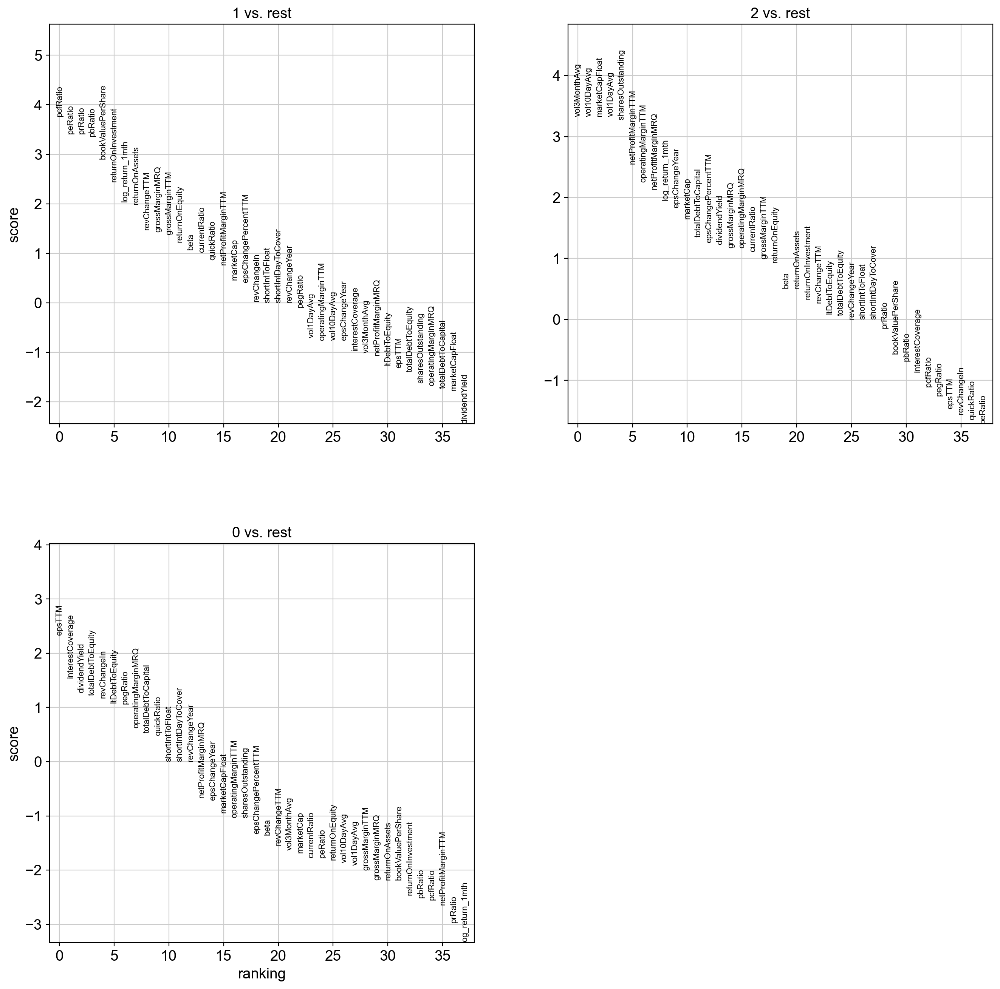

In [122]:
qp.tl.rank_features_groups(adata_c9, 'leiden', groups=['1', '2',  '0'], method='wilcoxon')
qp.pl.rank_features_groups(adata_c9, n_features=38, sharey=False, fontsize=8, ncols=2)

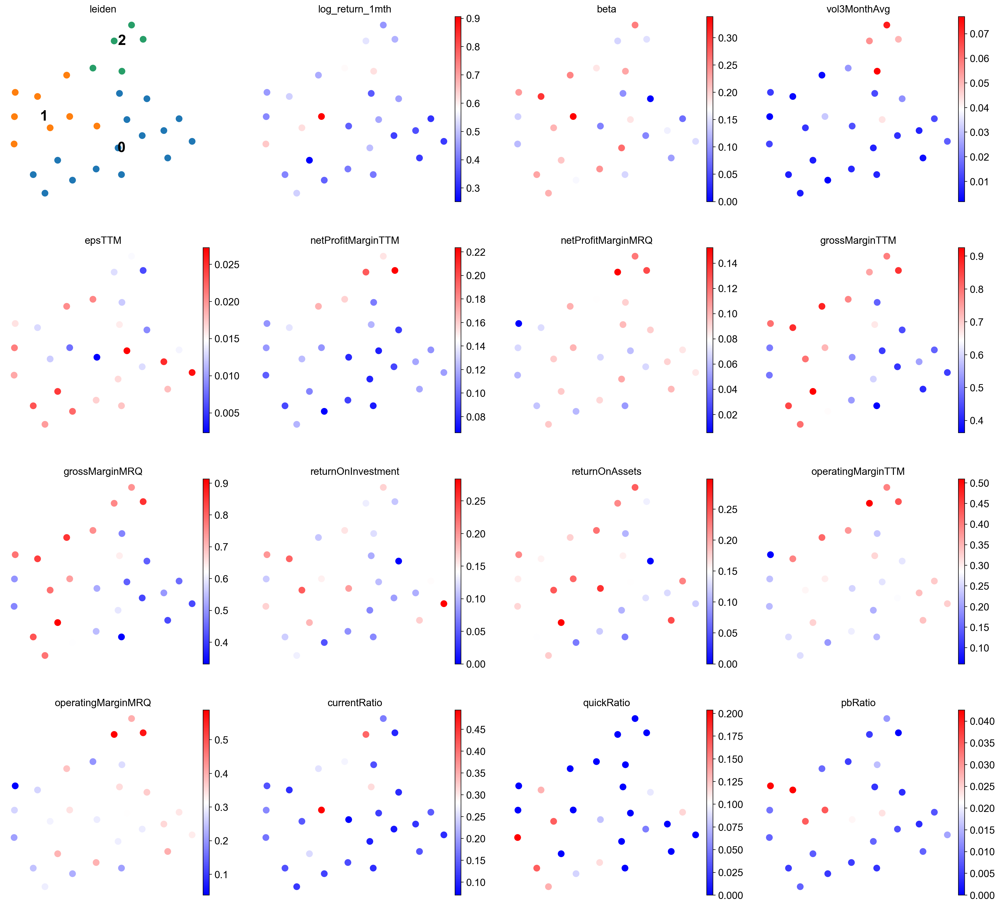

In [123]:
rcParams['figure.figsize'] = 5,5
qp.pl.umap(adata_c9, color=['leiden', 'log_return_1mth', 'beta', 'vol3MonthAvg', 'epsTTM', 
                            'netProfitMarginTTM', 
                         'netProfitMarginMRQ', 'grossMarginTTM', 'grossMarginMRQ', 
                         'returnOnInvestment', 'returnOnAssets', 'operatingMarginTTM', 
                         'operatingMarginMRQ', 'currentRatio', 'quickRatio', 'pbRatio', ], 
           legend_loc='on data', frameon=False, ncols=4, cmap='bwr', legend_fontsize=20, s=350)#, vmax=0.)

The sunburst chart below shows that Cluster 4 mostly consisted of Information Technology Sector, Cluster 10 mostly Energy Sector, Cluster 9 Financial Sector, and Cluster 2 Real Estate Sector.

In [220]:
df_c6.sort_values(by=['leiden', 'GICS Sector', 'GICS Sub-Industry', 'pbRatio'])[['leiden', 'GICS Sector', 'GICS Sub-Industry', 'pbRatio', 'log_return_1mth']]

,leiden,GICS Sector,GICS Sub-Industry,pbRatio,log_return_1mth
NTRS,0,Financials,Asset Management & Custody Banks,1.77194,-0.020357
AMP,0,Financials,Asset Management & Custody Banks,3.65183,0.014603
AXP,0,Financials,Consumer Finance,4.28506,0.008804
GS,0,Financials,Investment Banking & Brokerage,1.08561,0.074931
MS,0,Financials,Investment Banking & Brokerage,1.33874,0.087380
RJF,0,Financials,Investment Banking & Brokerage,1.80341,0.048348
SCHW,0,Financials,Investment Banking & Brokerage,2.55975,0.061082
DE,0,Industrials,Agricultural & Farm Machinery,6.49157,0.047238
SLG,0,Real Estate,Office REITs,0.84248,-0.036331
FRT,0,Real Estate,Retail REITs,2.99688,-0.033407


In [221]:
import plotly.express as px

# grouping statistics
df_c6_reindex = df_c6.reset_index(drop=False)
ds = df_c6_reindex.groupby(['leiden', 'GICS Sector', 'GICS Sub-Industry', 'index'])['log_return_1mth'].count().reset_index()
ds.columns = ['leiden', 'GICS Sector', 'GICS Sub-Industry', 'index', 'count']

# plotting sunburst
fig = px.sunburst(
    ds, 
    path=[
        'leiden', 'GICS Sector', 'GICS Sub-Industry', 'index'
    ], 
    values='count', 
    title='Sunburst chart',
    width=800,
    height=800
)
fig.show()

#### The sunburst chart below shows that most of the Real Estate companies Fall on the worst performer 1-month post vaccine success, Cluster 2.

In [230]:
import plotly.express as px
from itertools import repeat

dict_regroup = {}
dict_regroup['0'] = 'C0 - Top performer'
dict_regroup['1'] = 'C1 - Second performer'
dict_regroup['2'] = 'C2 - Second to Worst performer'
dict_regroup['3'] = 'C3 - Worst performer'

df_regrouped = df_c6.replace({'leiden': dict_regroup})

# grouping statistics
ds = df_regrouped.groupby(['GICS Sector', 'leiden'])['log_return_1mth'].count().reset_index()
ds.columns = ['GICS Sector', 'leiden', 'count']

# plotting sunburst
fig = px.sunburst(
    ds, 
    path=[
        'GICS Sector','leiden'
    ], 
    values='count', 
    title='Sunburst chart',
    width=700,
    height=700
)
fig.show()

## Conclusions:-
In this tutorial, we found that the Cluster 10 was the top performer, followed by Clusters 7 and 4. However, Clusters 10 and 7 companies were associated with high beta - higher risk in stock market. Their performance were unjustifiable with statistically lower Operating Profit Factor. In comparison, Cluster 4 companies have lower beta - less risky, and its performance is justified by favorable higher Operating Profit Factor and lower Financial Risk Factors.

On the other hand, the worst performer was the Cluster 2, followed by Cluster 9. Both clusters have significantly lower solvency (current and quick ratios). Cluster 2 was also associated with higher financial risk, i.e. higher debt-to-capital/Equity. Of note, the cluster 2 was consisted mainly of the Real Estate companies. The worst performance probably justified by the on-going second wave during the current winter season, where city lockdown is widely adopted.